In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!ls /content/drive/My\Drive\/Grupo5SDR/

11b11M_2024-07-01T20_18_10_941.wav  11g9M_2024-07-01T20_18_58_142.wav
11b1M_2024-07-01T20_17_08_877.wav   11nMsc2_2024-07-01T20_21_53_109.wav
11b2M_2024-07-01T20_17_26_362.wav   11nMsc3_2024-07-01T20_22_12_702.wav
11g12M_2024-07-01T20_19_20_533.wav  11nMsc4_2024-07-01T20_22_31_326.wav
11g18M_2024-07-01T20_19_35_301.wav  11nMsc5_2024-07-01T20_22_49_733.wav
11g24M_2024-07-01T20_19_54_816.wav  11nMsc6_2024-07-01T20_23_04_708.wav
11g36M_2024-07-01T20_20_19_717.wav  11nMsc7_2024-07-01T20_23_20_259.wav
11g48M_2024-07-01T20_20_35_094.wav  ruido_2024-07-01T20_23_37_094.wav
11g6M_2024-07-01T20_18_35_127.wav


## Espectrogramas de señales 802.11b

<ipython-input-4-69db7ea71e27>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


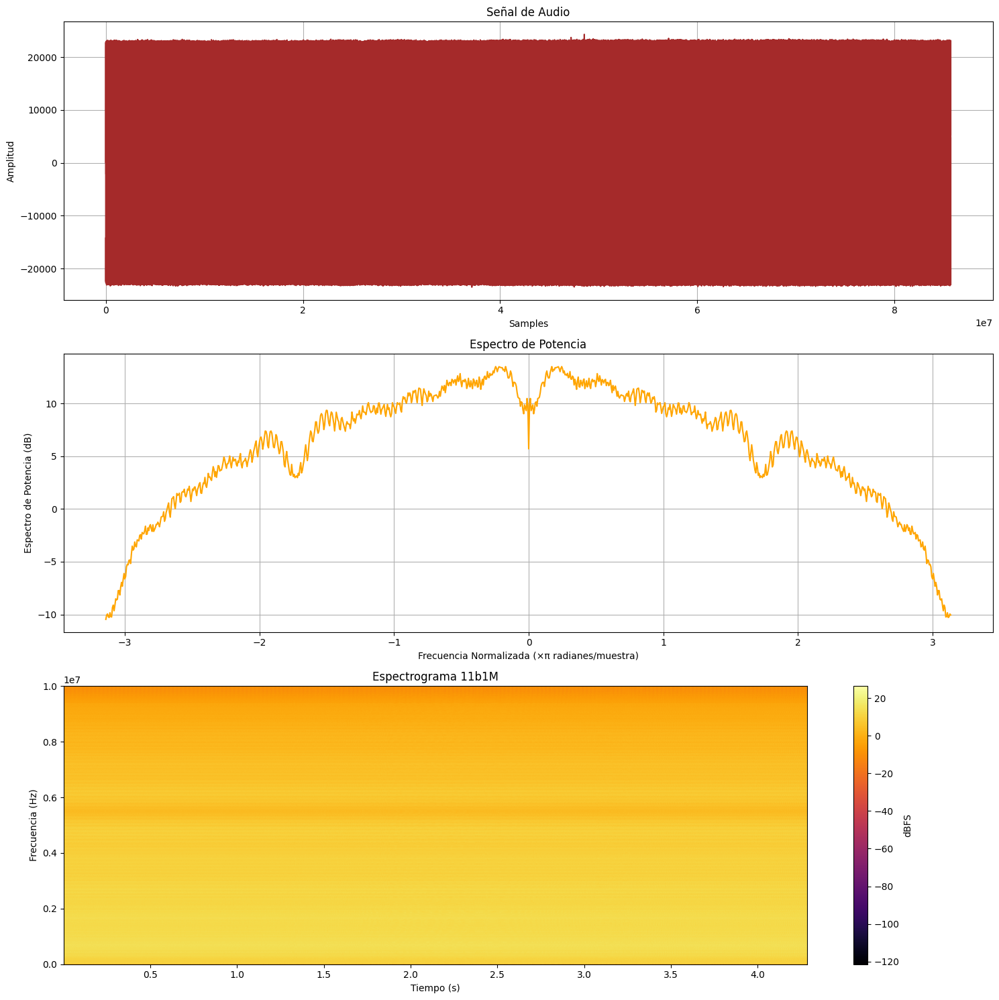

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11b1M_2024-07-01T20_17_08_877.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b1M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-5-e5684eaef4cf>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


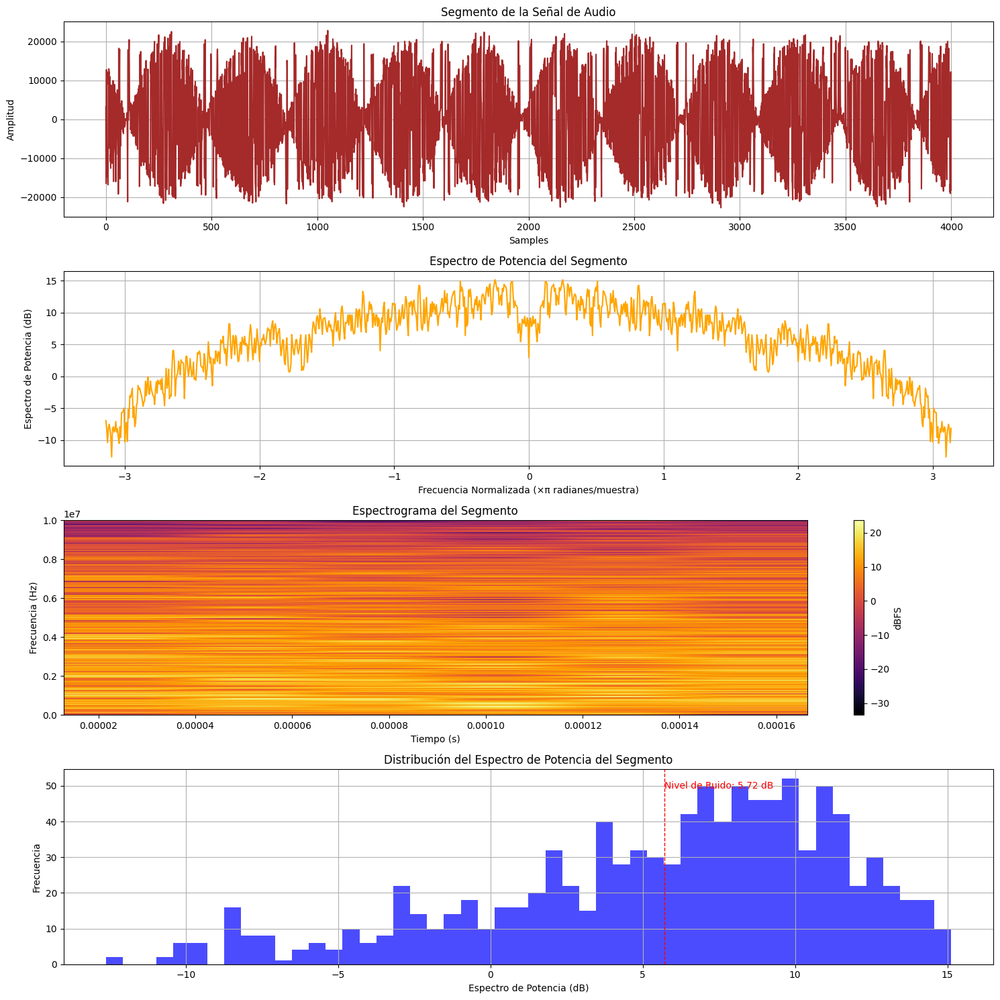

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11b1M_2024-07-01T20_17_08_877.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-6-575f2c557b9f>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


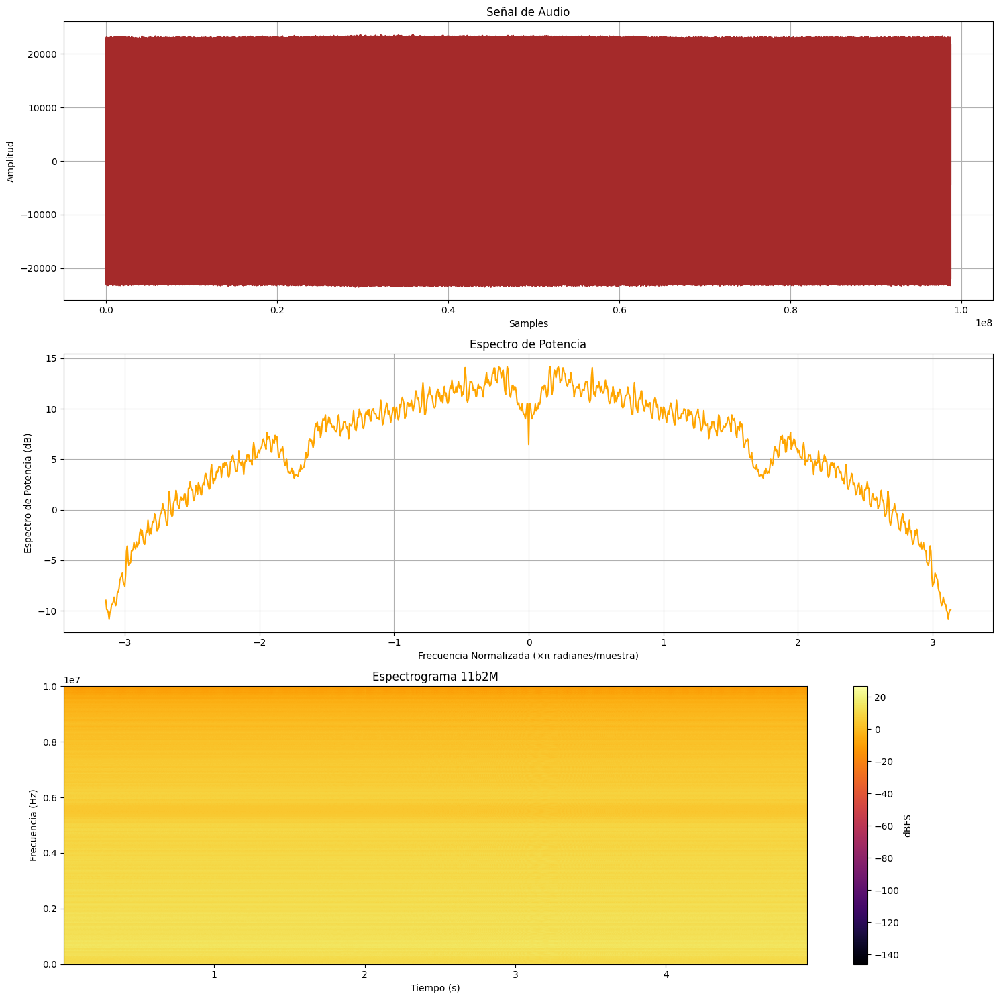

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11b2M_2024-07-01T20_17_26_362.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b2M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-7-a817f68a7c92>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


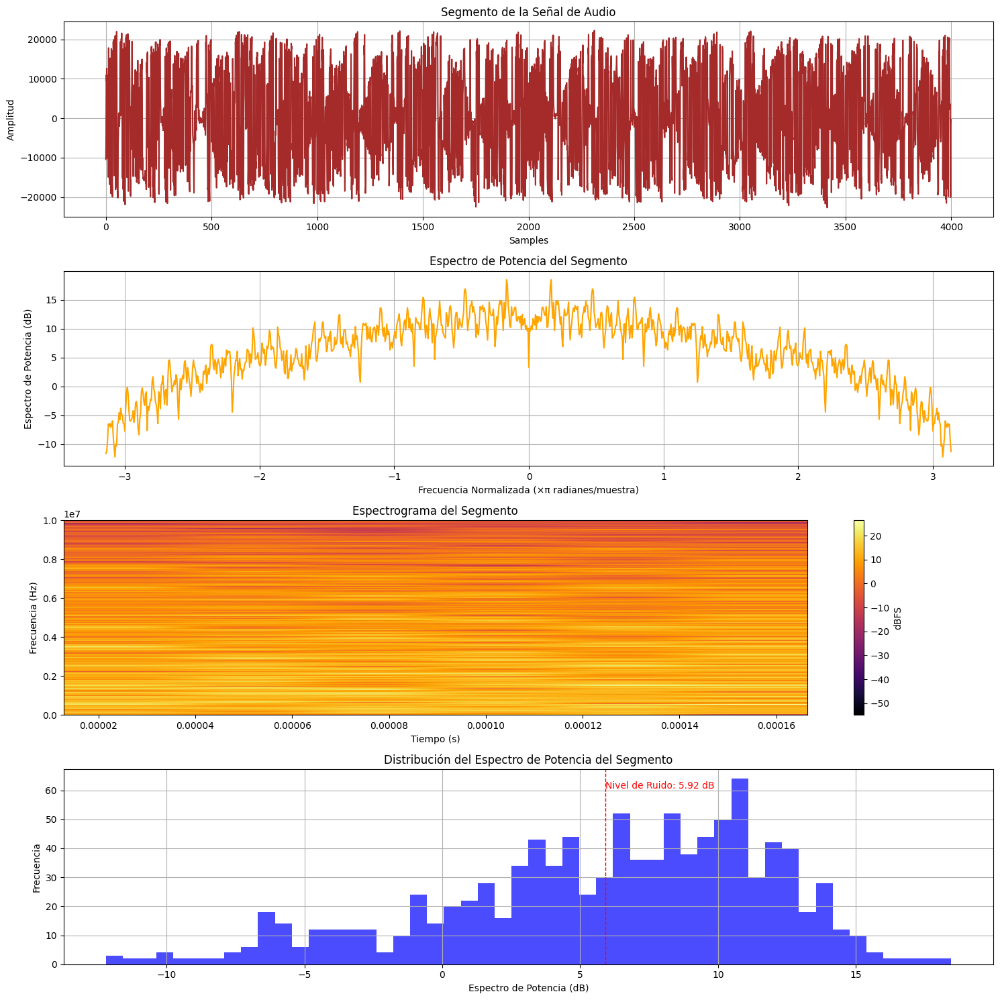

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11b2M_2024-07-01T20_17_26_362.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-8-1c7d59d7c58d>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


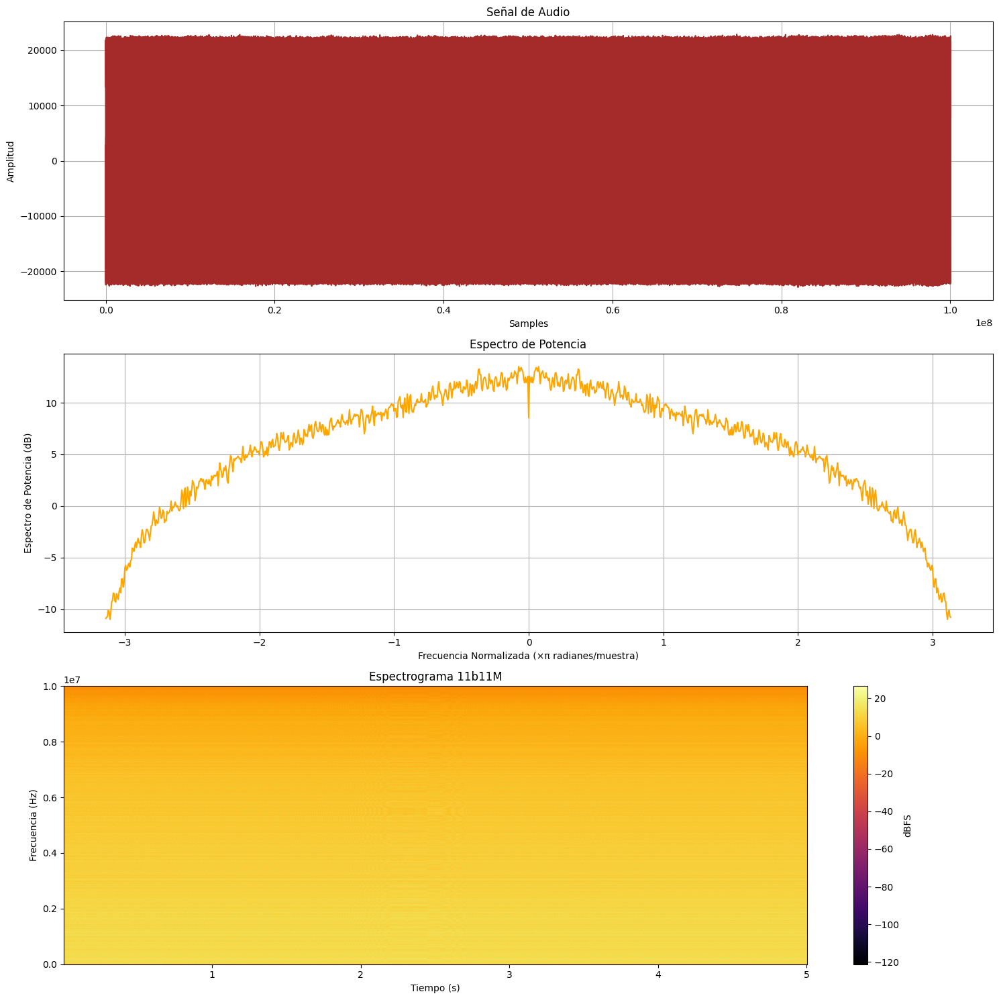

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11b11M_2024-07-01T20_18_10_941.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b11M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-9-a8bfe1369d58>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


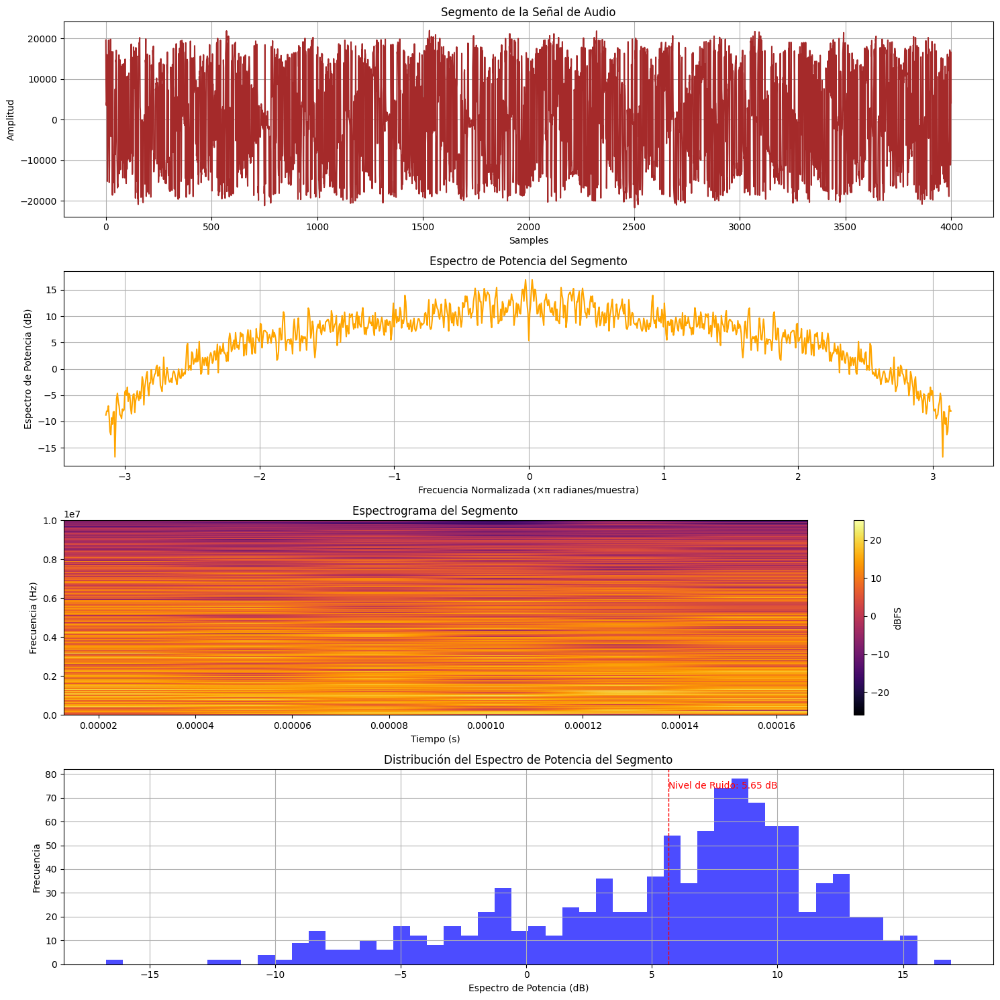

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11b11M_2024-07-01T20_18_10_941.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señal de ruido

<ipython-input-10-95134067a59e>:12: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


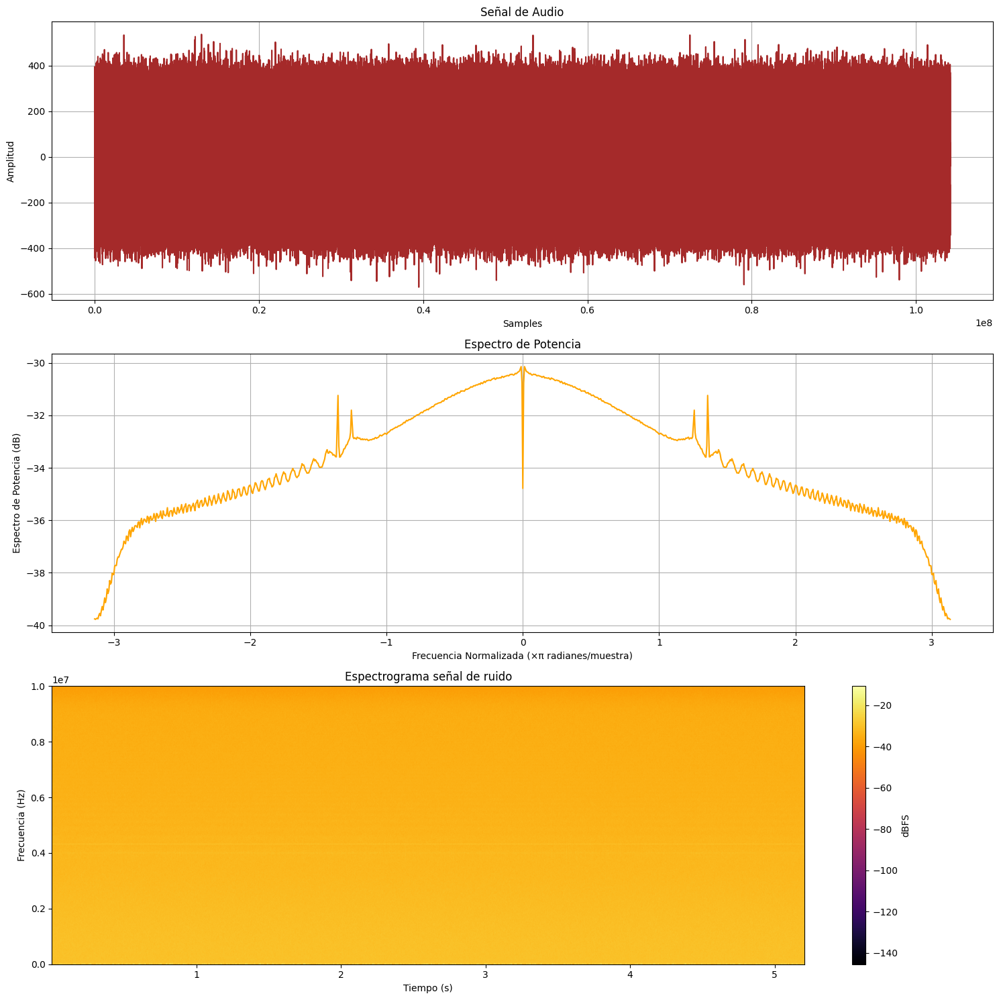

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/ruido_2024-07-01T20_23_37_094.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma señal de ruido')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-11-432bf0846665>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


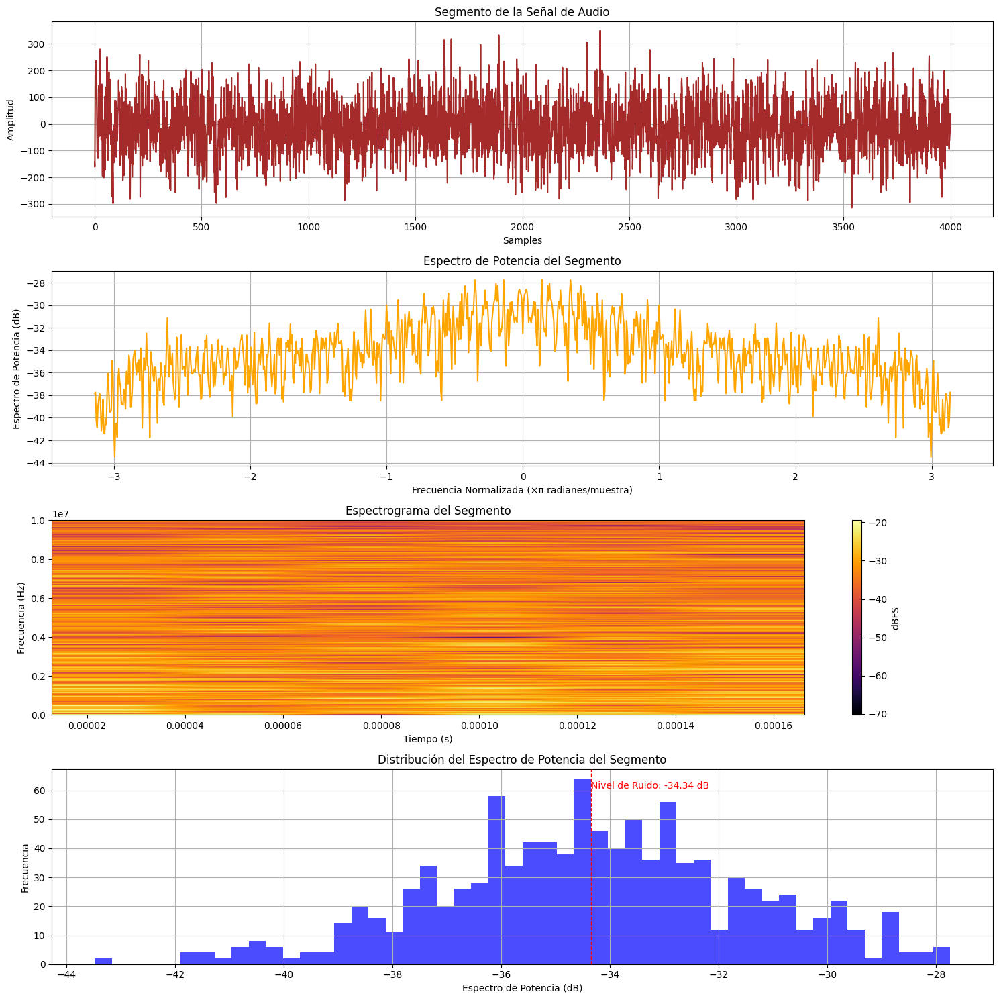

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/ruido_2024-07-01T20_23_37_094.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señales 802.11n

<ipython-input-12-033a130f8c9f>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


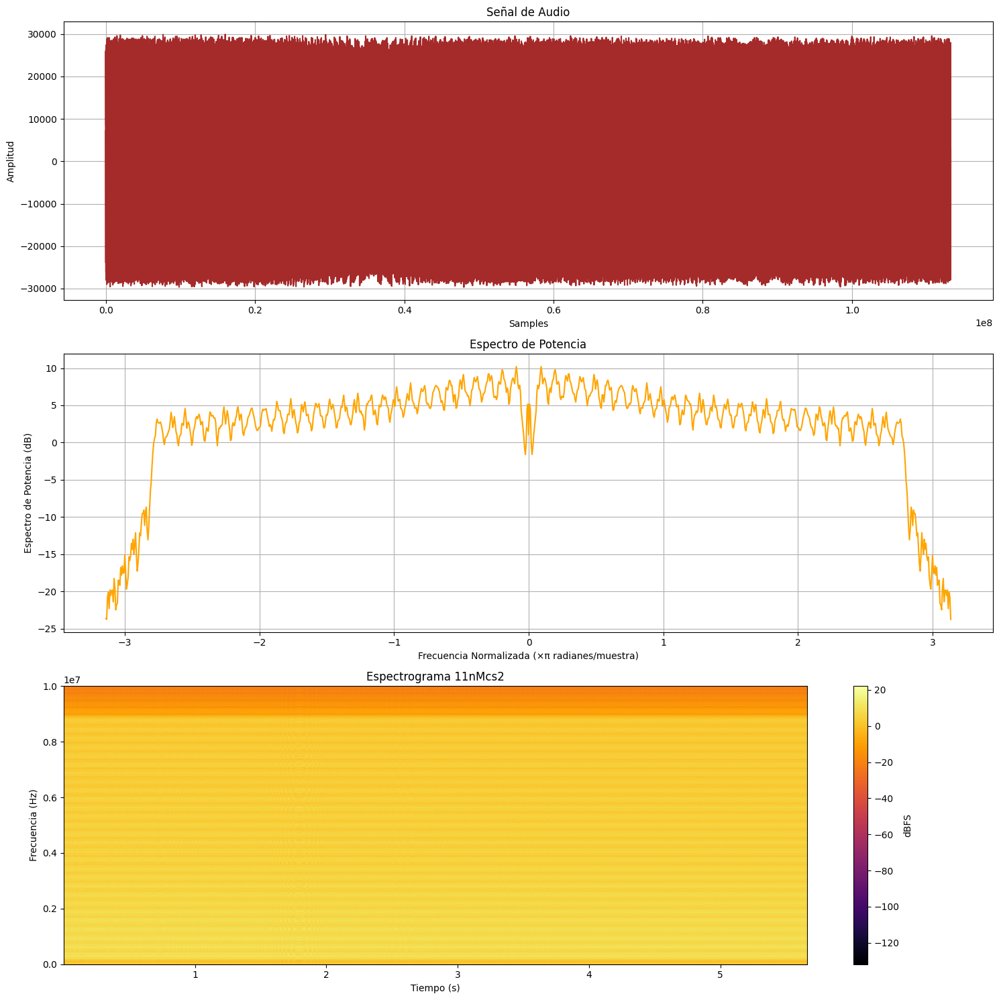

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc2_2024-07-01T20_21_53_109.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs2')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-13-3b18ca33d138>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


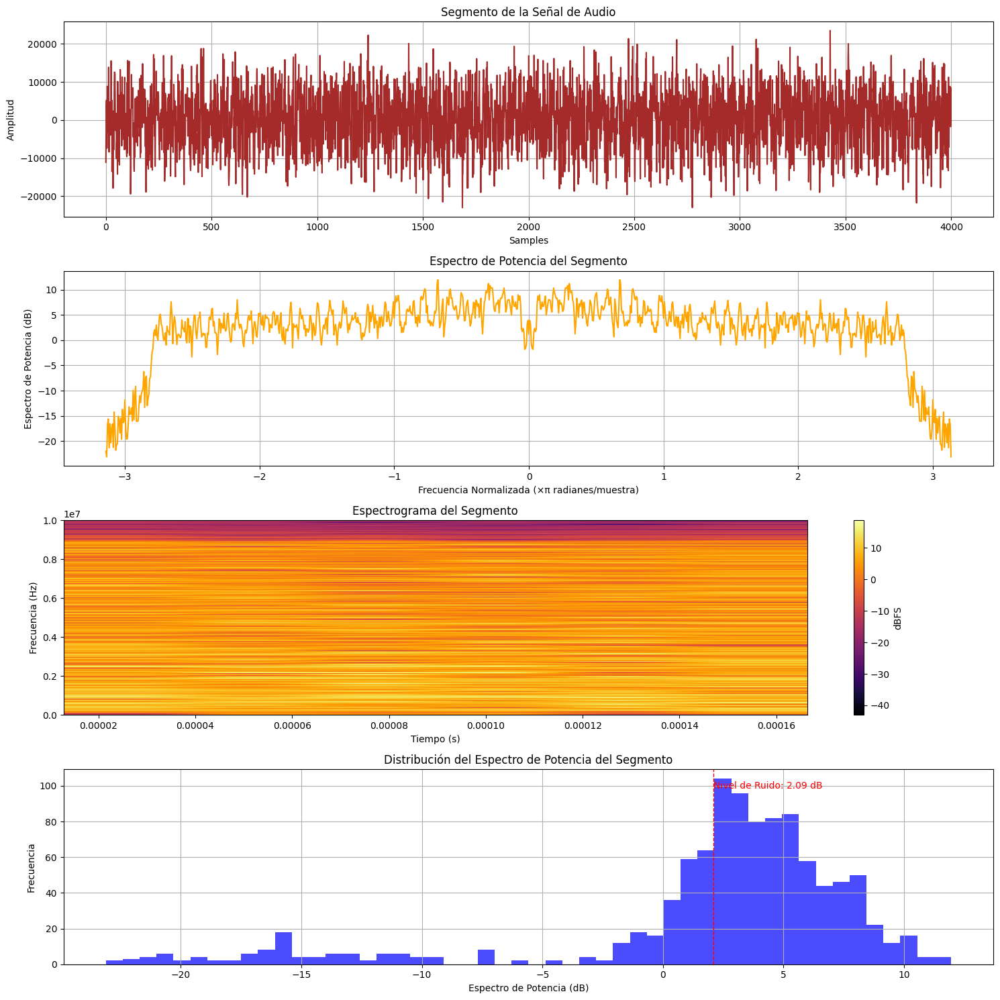

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc2_2024-07-01T20_21_53_109.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-14-f956ef57e055>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


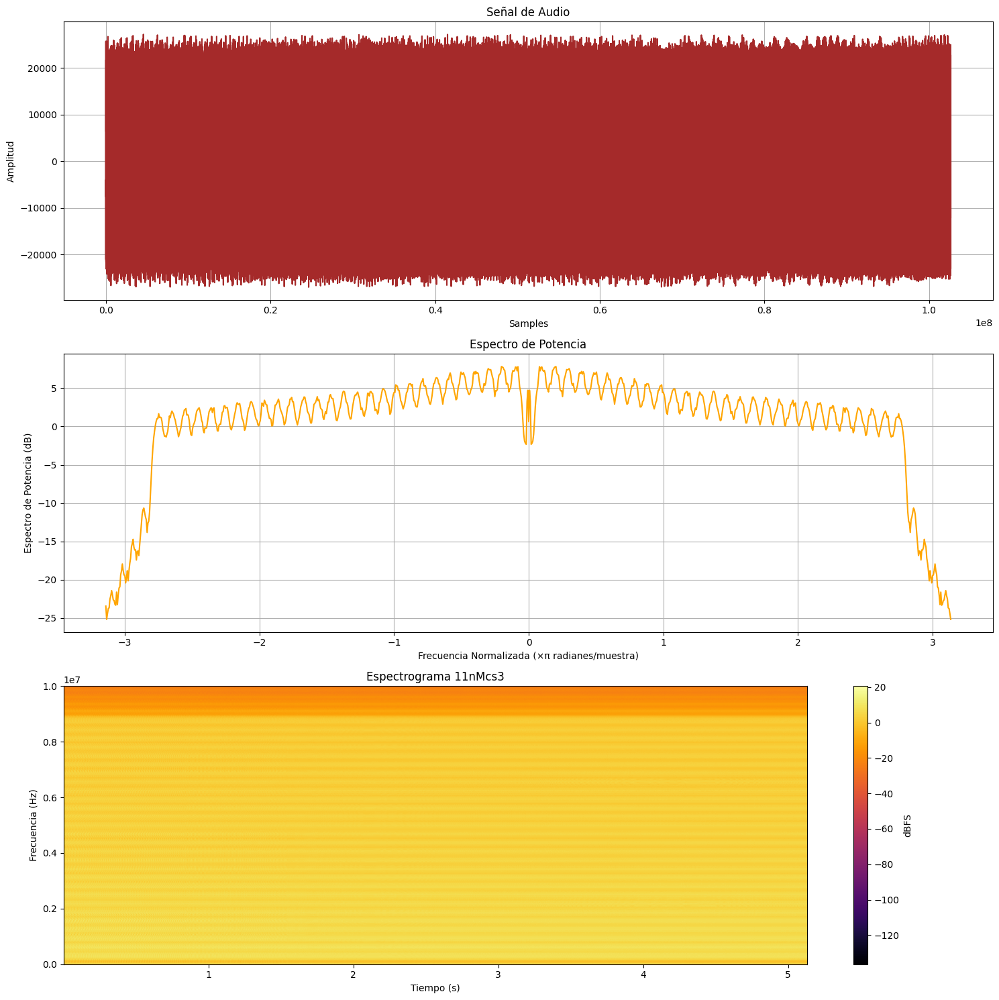

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc3_2024-07-01T20_22_12_702.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs3')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-15-0220c2ba037c>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


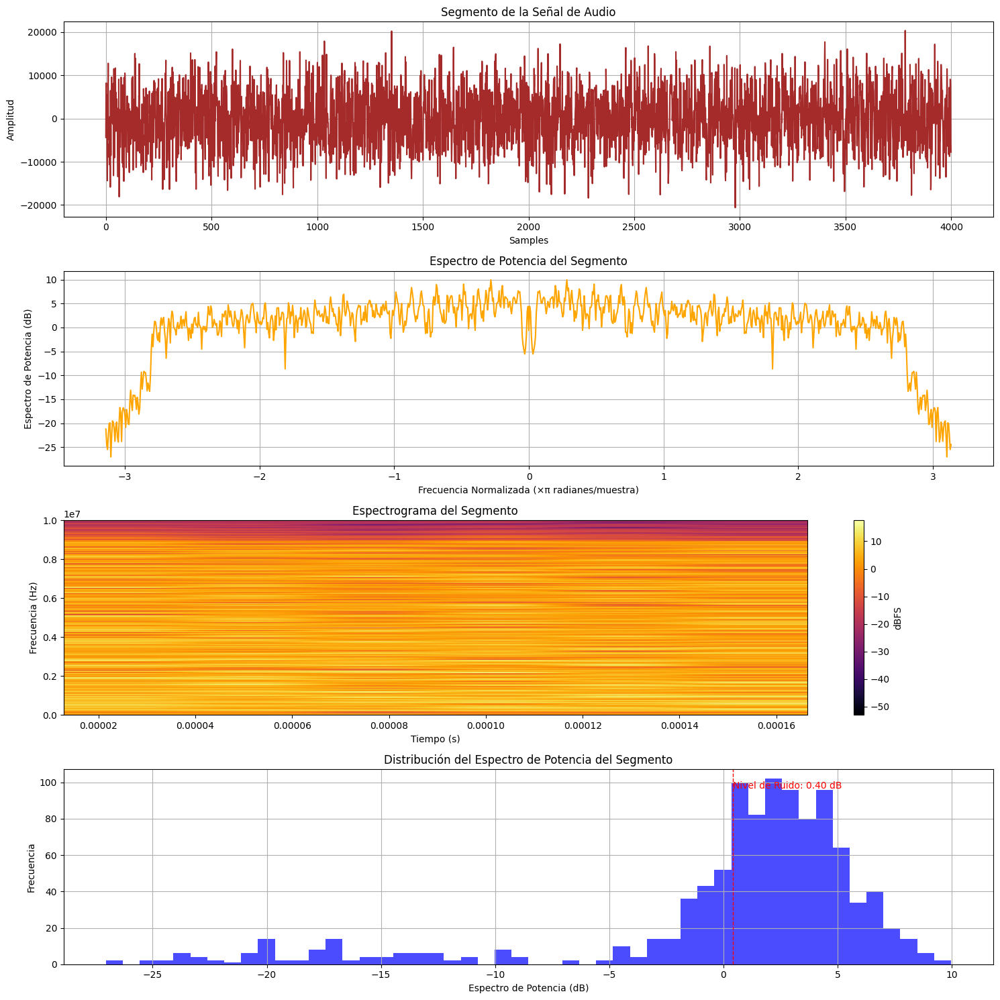

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc3_2024-07-01T20_22_12_702.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-16-dfbd25469c85>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


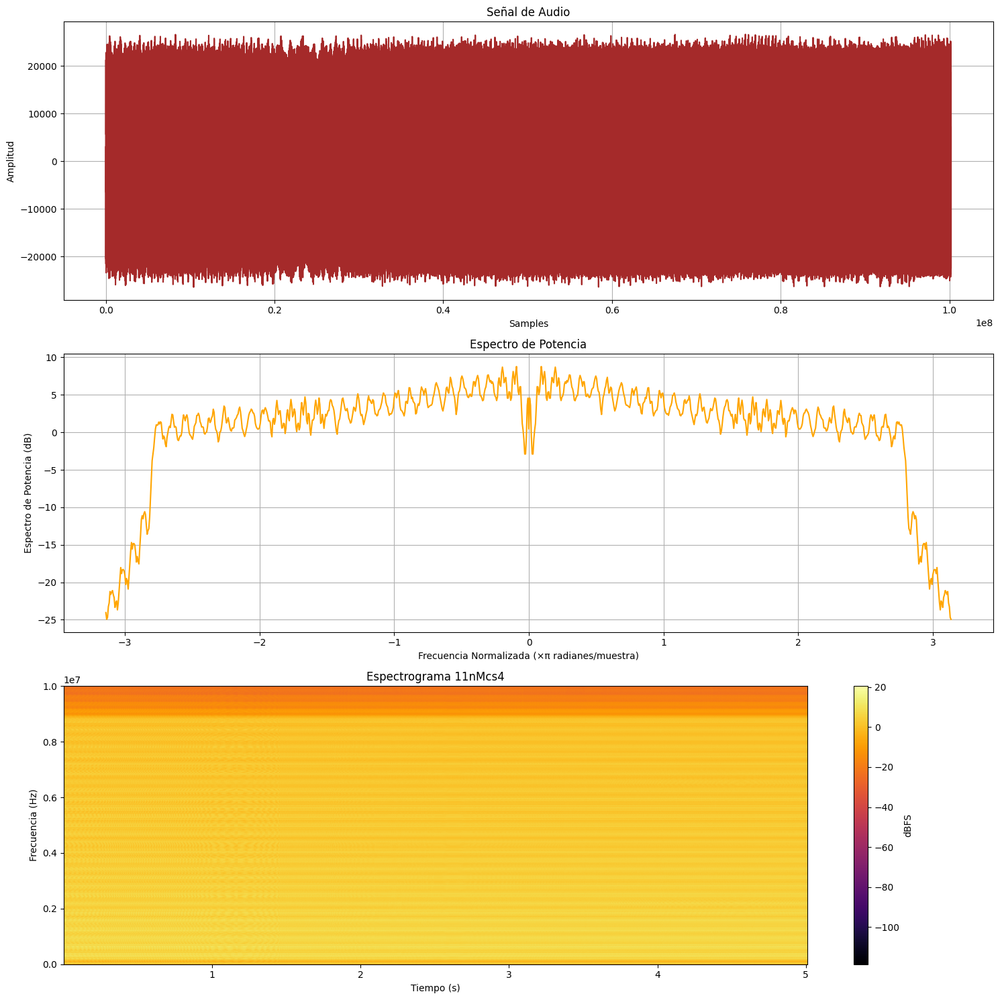

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc4_2024-07-01T20_22_31_326.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs4')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-17-6c2e008690ff>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


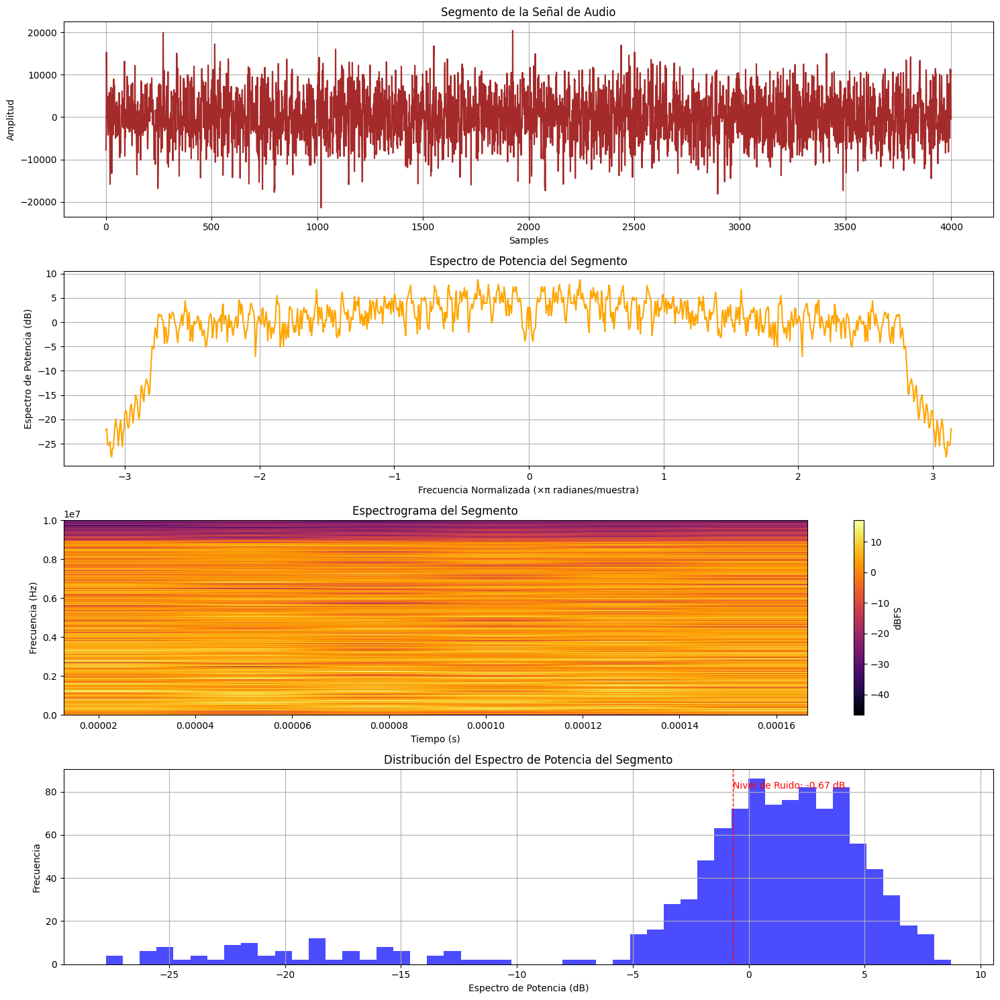

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc5_2024-07-01T20_22_49_733.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-18-49c27b43ac50>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


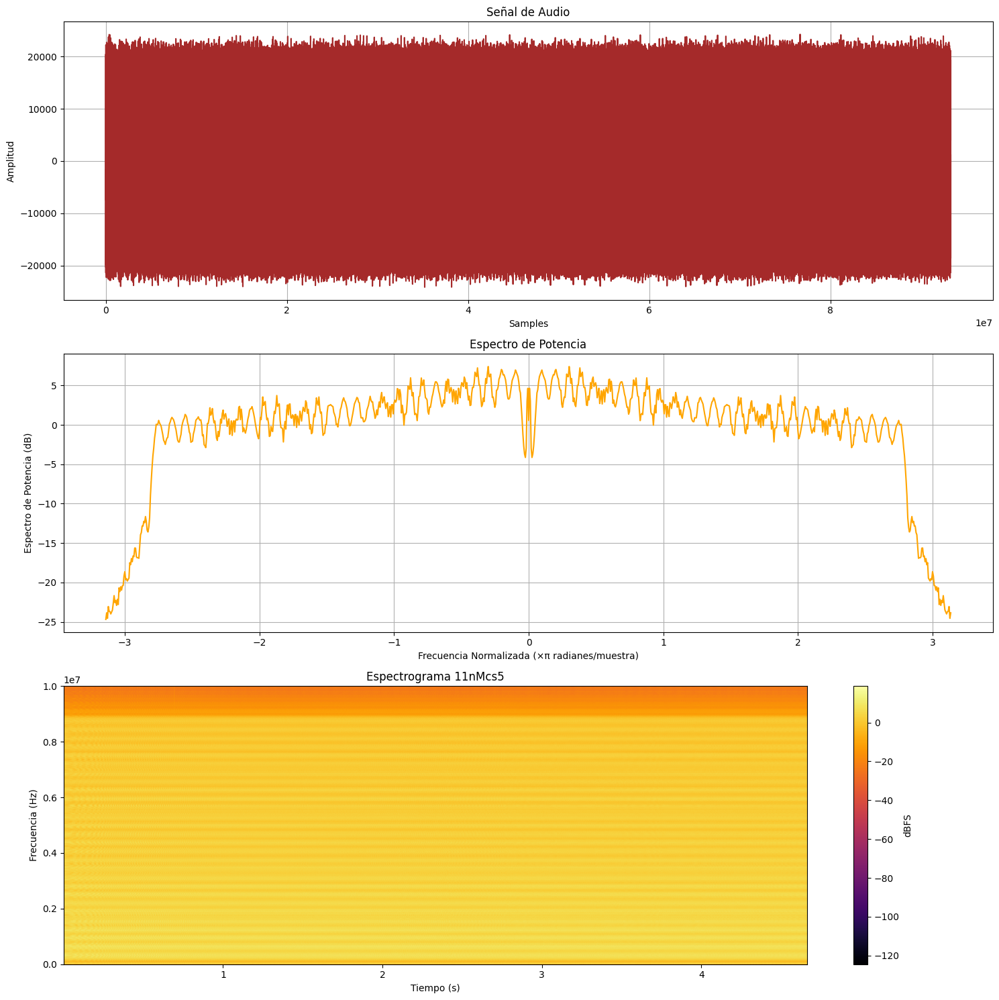

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc5_2024-07-01T20_22_49_733.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs5')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-19-c9856d805656>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


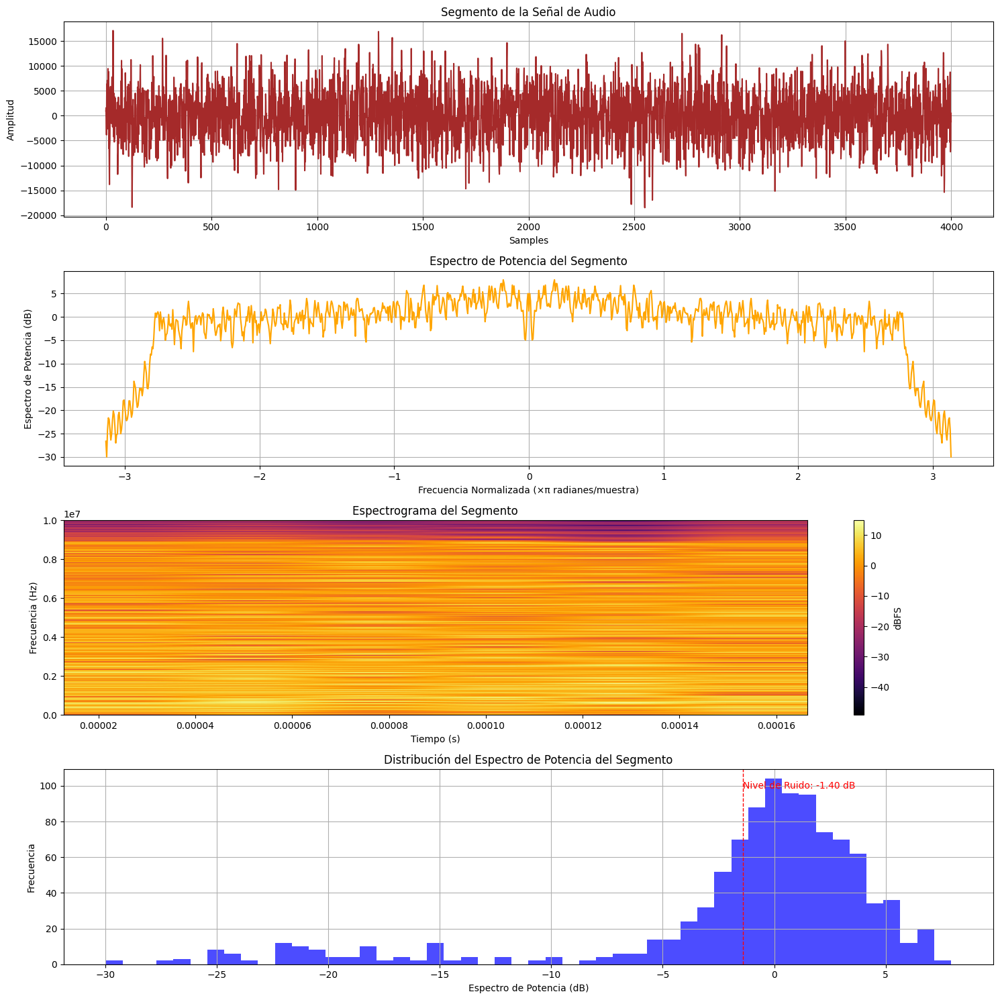

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc6_2024-07-01T20_23_04_708.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-20-066cb6e48898>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


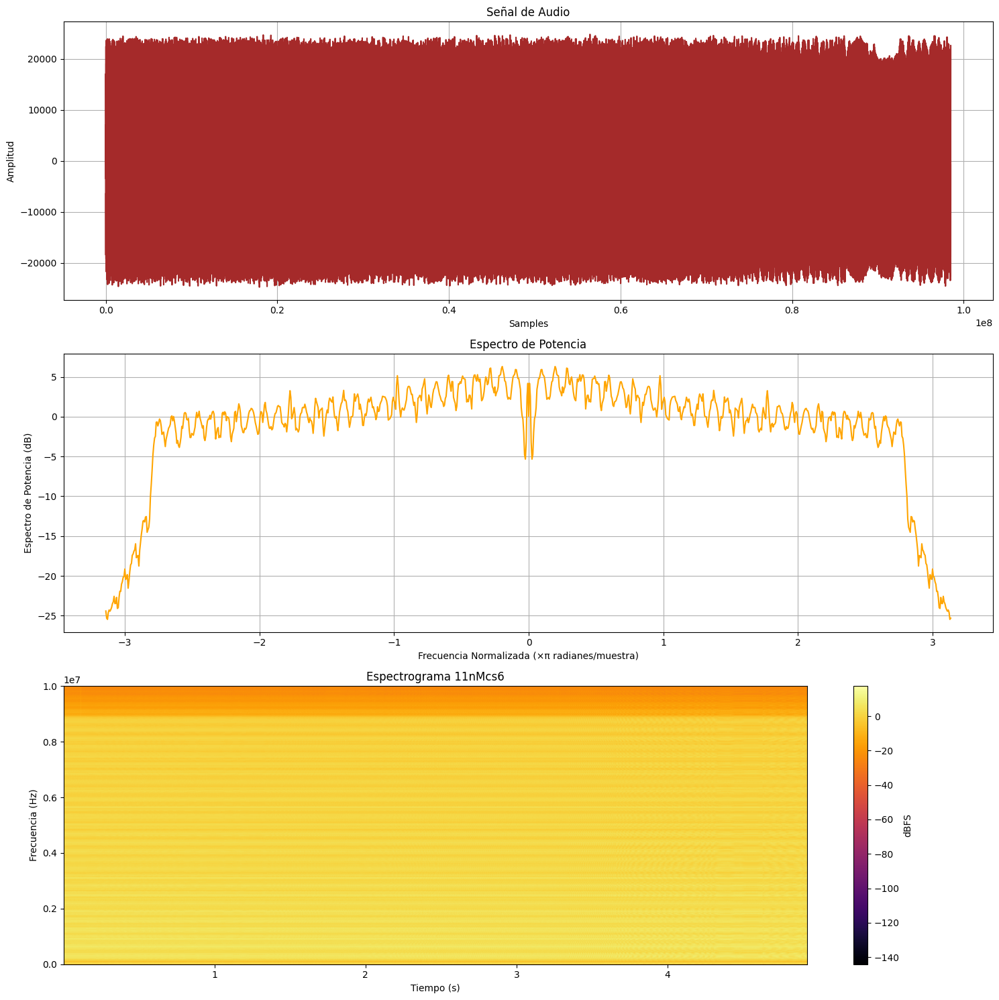

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc6_2024-07-01T20_23_04_708.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs6' )
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-20-61bbaae380c6>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


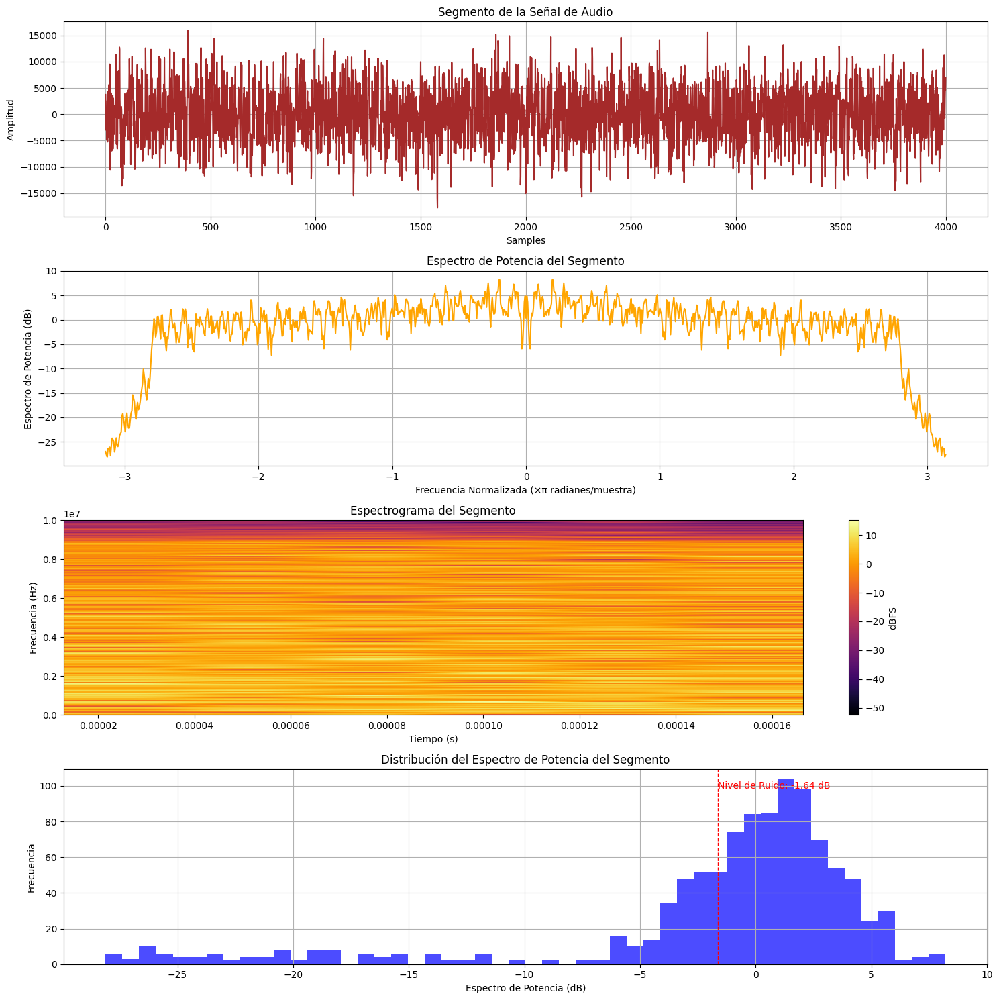

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc7_2024-07-01T20_23_20_259.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-21-028e9ea2bf69>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


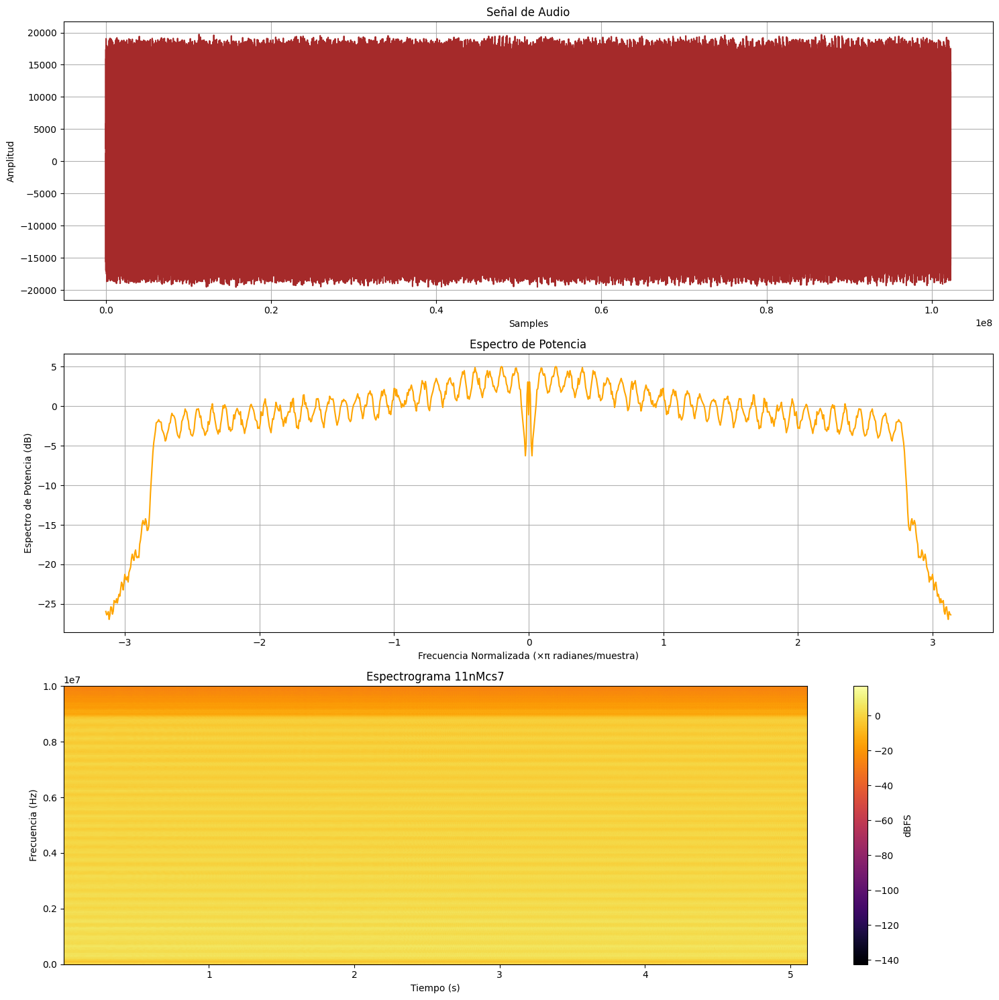

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc7_2024-07-01T20_23_20_259.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs7')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-22-3fc269039062>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


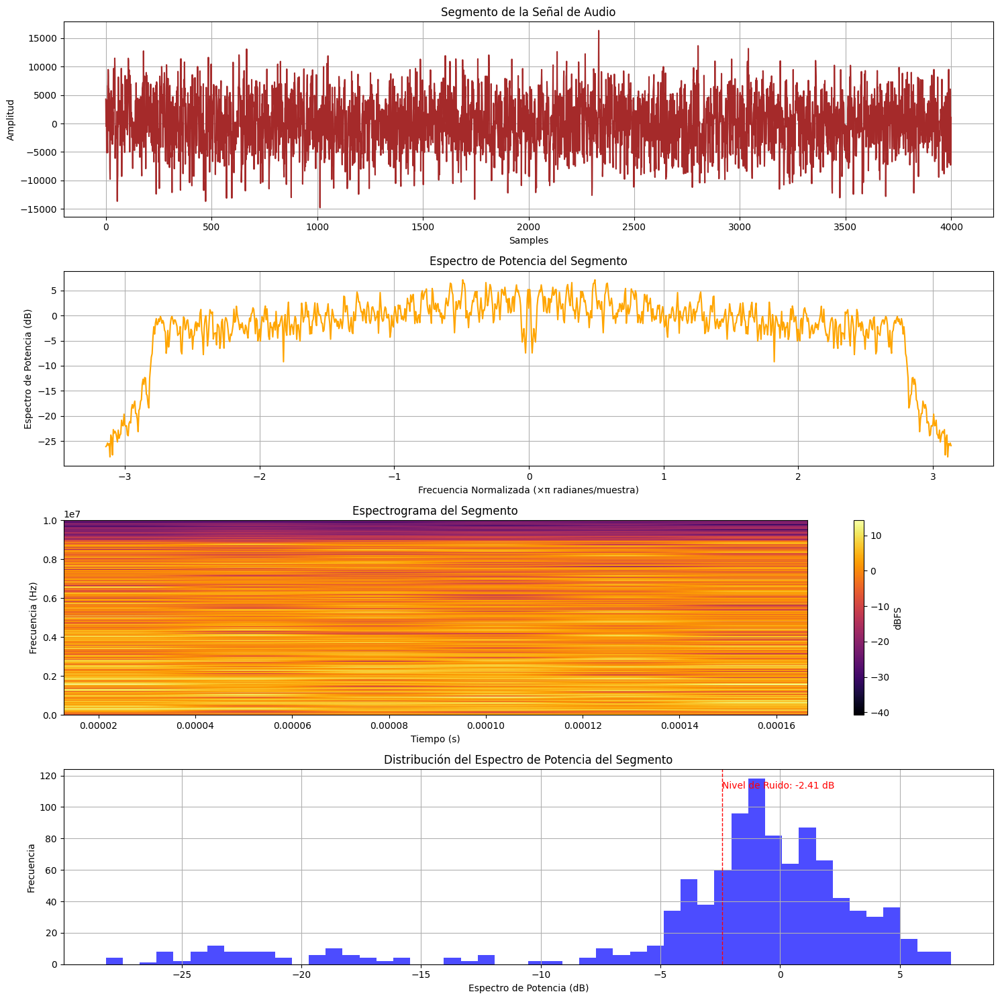

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11nMsc7_2024-07-01T20_23_20_259.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señales 802.11g

<ipython-input-3-d1c370e1501b>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


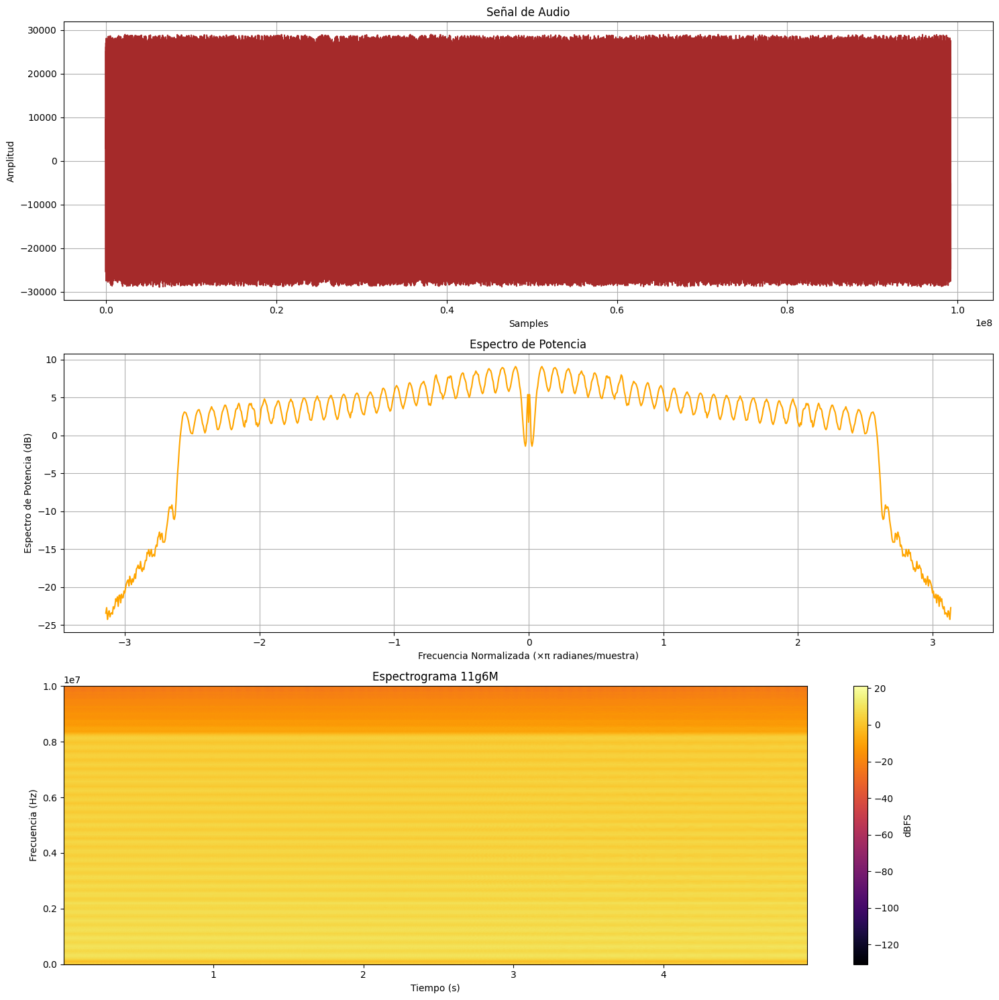

In [3]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g6M_2024-07-01T20_18_35_127.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g6M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-4-1fd856a743a8>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


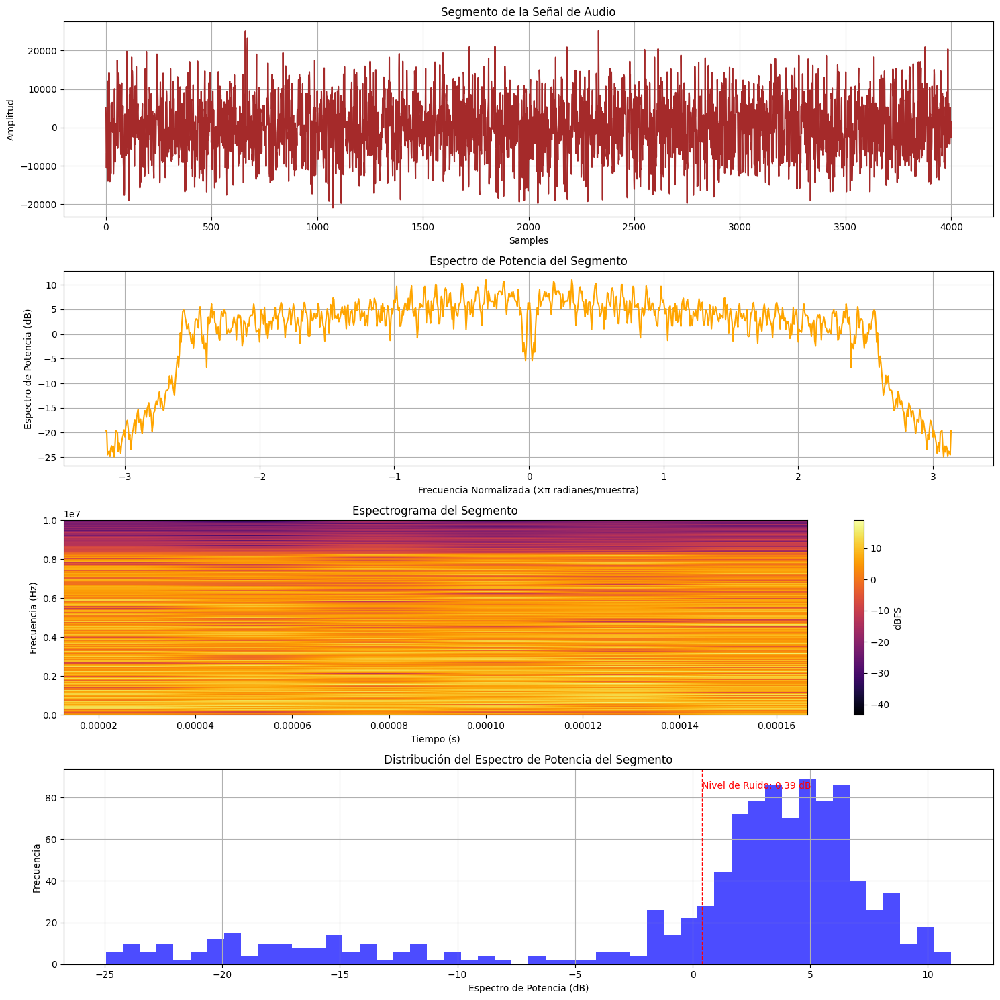

In [4]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g6M_2024-07-01T20_18_35_127.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-25-c802380c32df>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


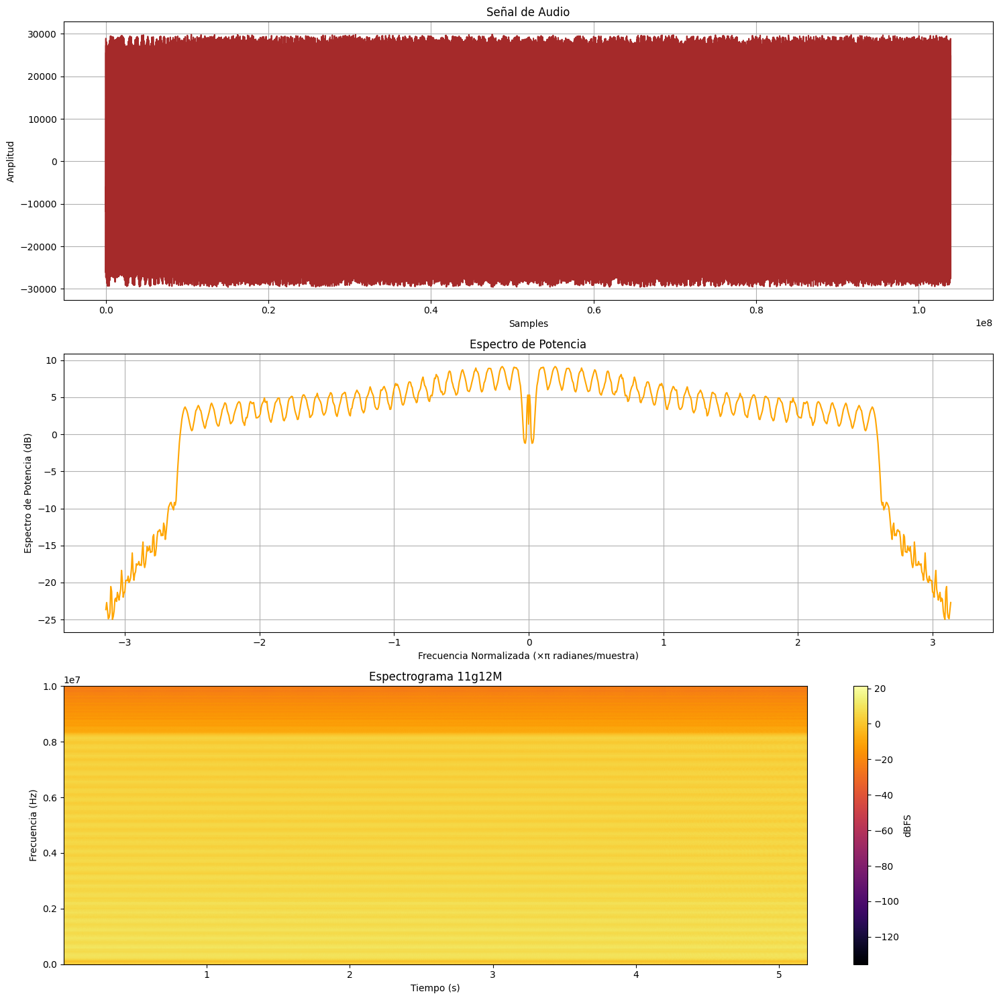

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g12M_2024-07-01T20_19_20_533.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g12M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-26-e1a13e0ca9f3>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


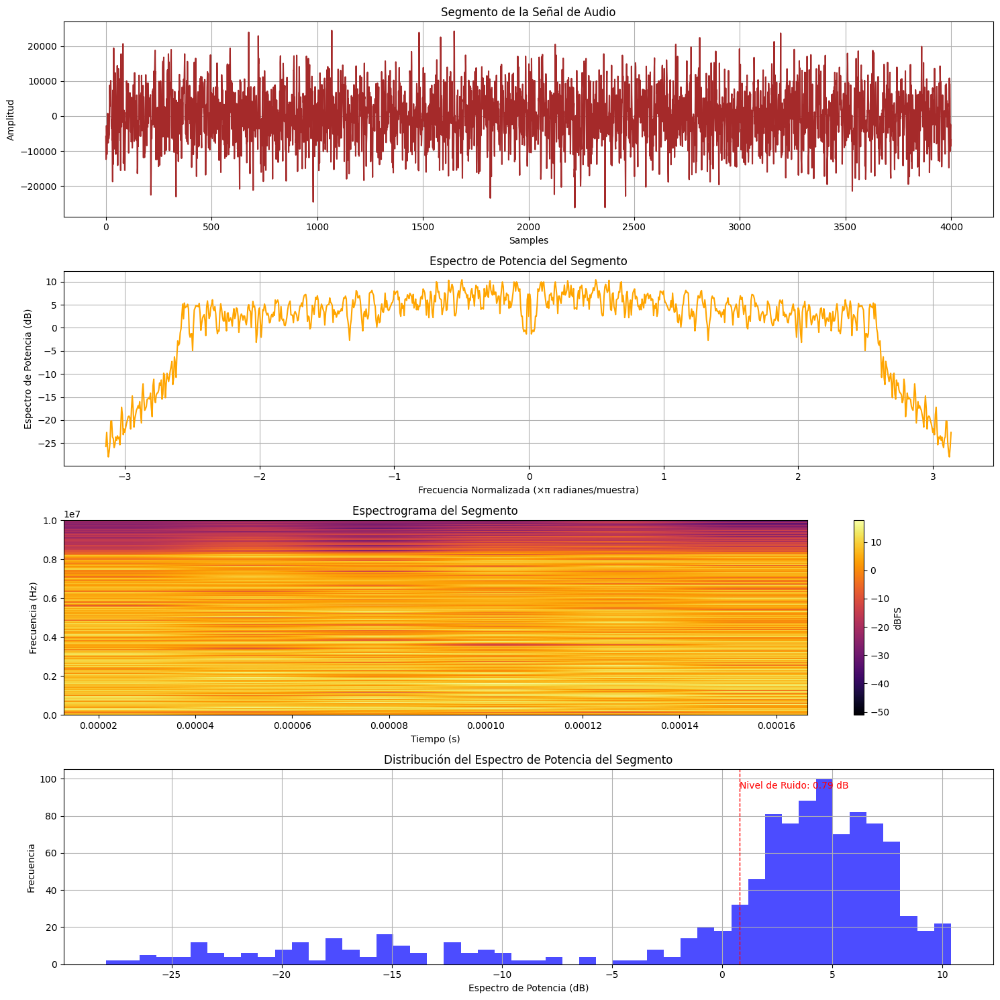

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g12M_2024-07-01T20_19_20_533.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-27-d8eb4b97ed0c>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


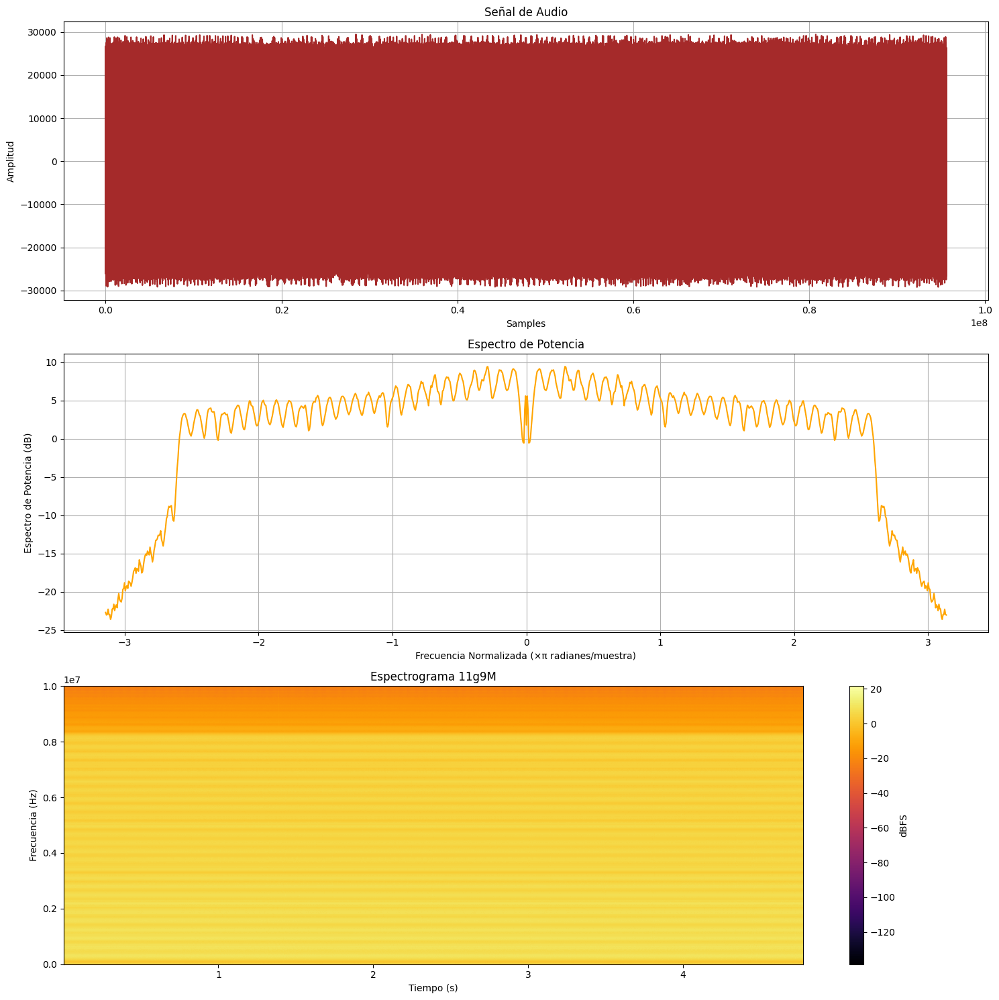

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g9M_2024-07-01T20_18_58_142.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g9M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-28-042448714133>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


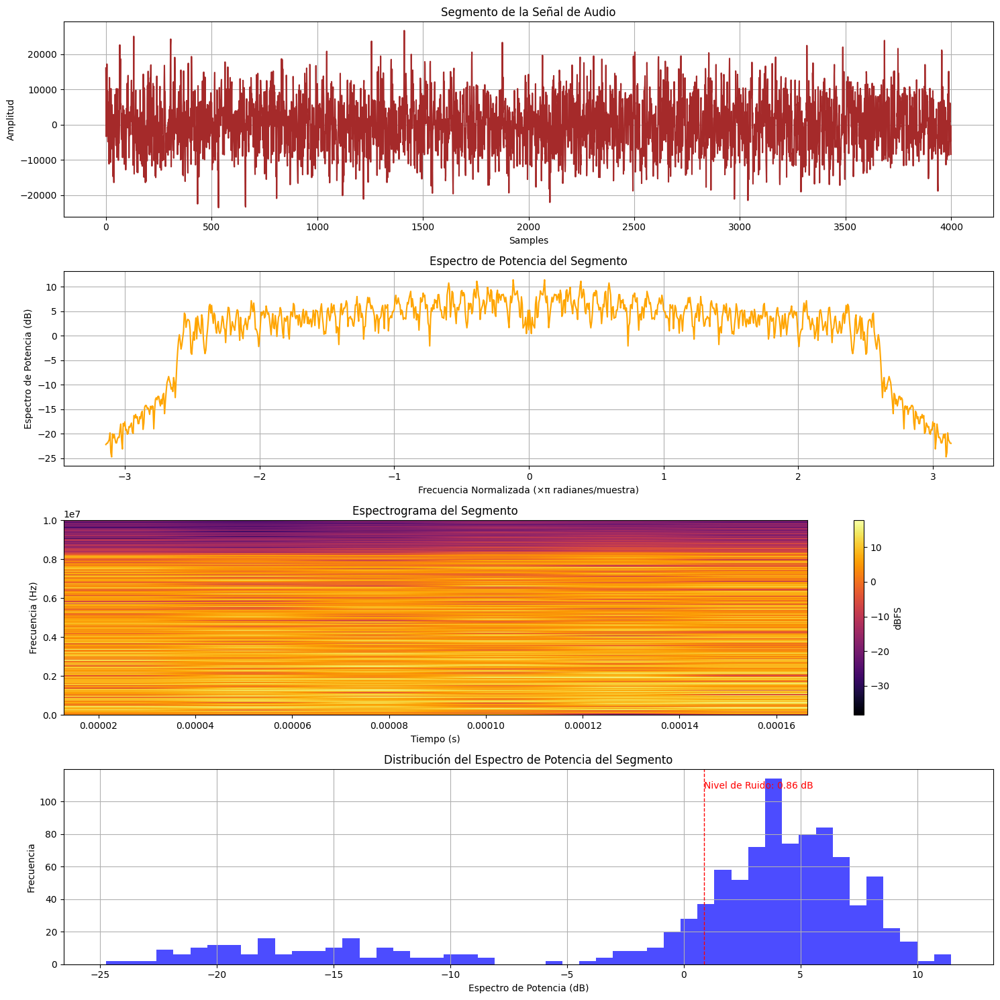

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g9M_2024-07-01T20_18_58_142.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-29-73ac7c5cd651>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


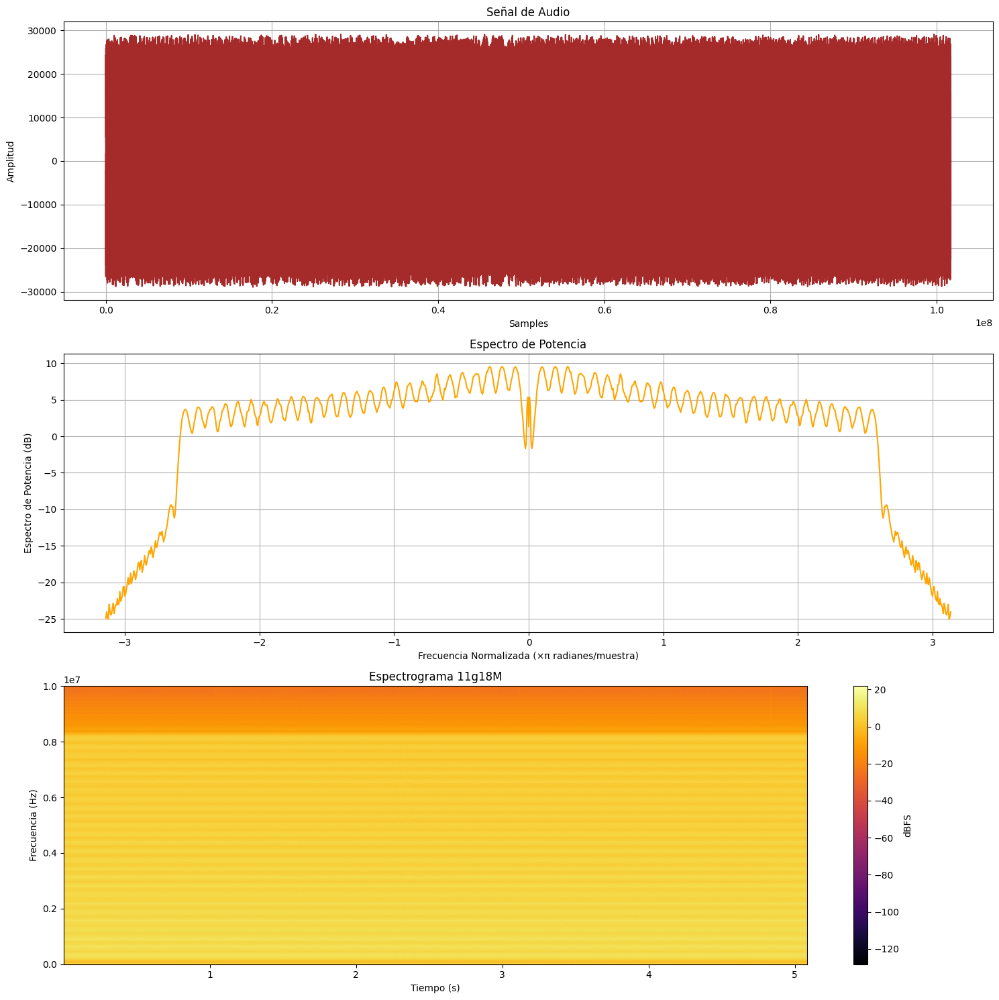

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g18M_2024-07-01T20_19_35_301.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g18M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-30-6fa10358a557>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


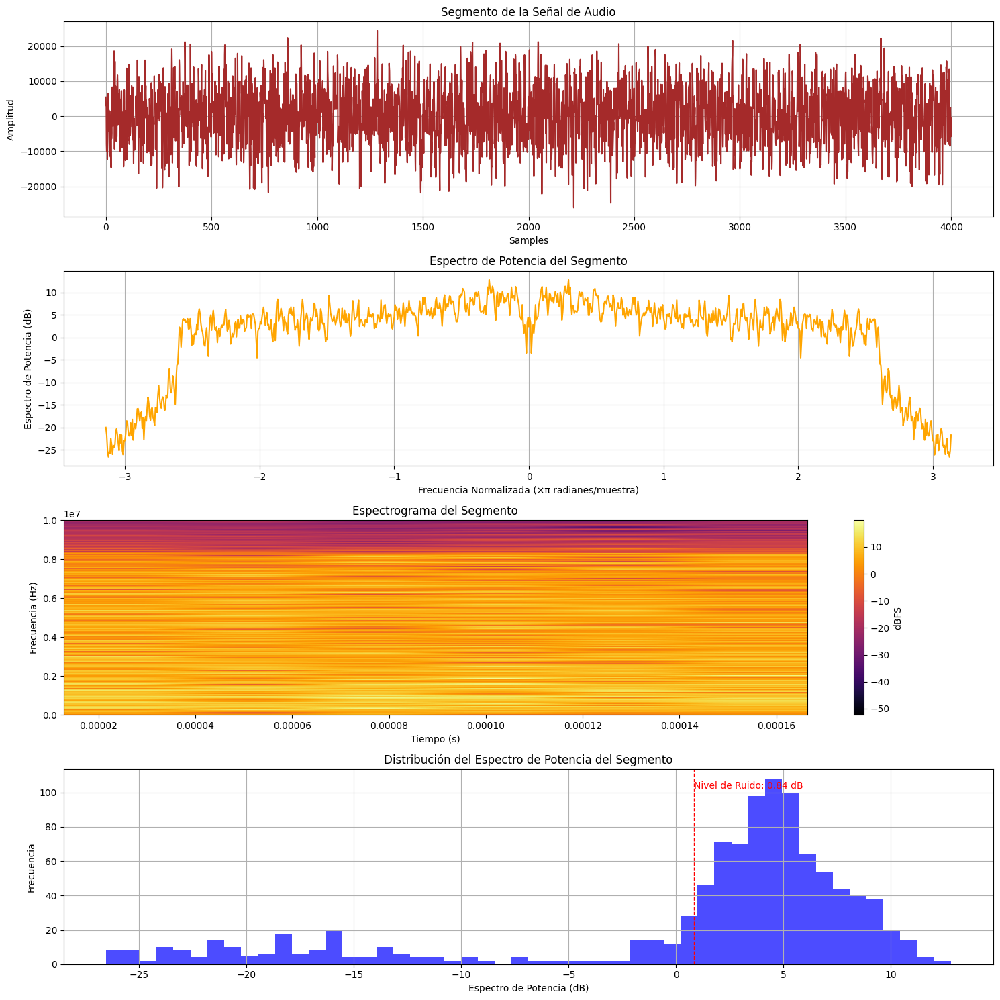

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g18M_2024-07-01T20_19_35_301.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-31-ba8dff7c8b91>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


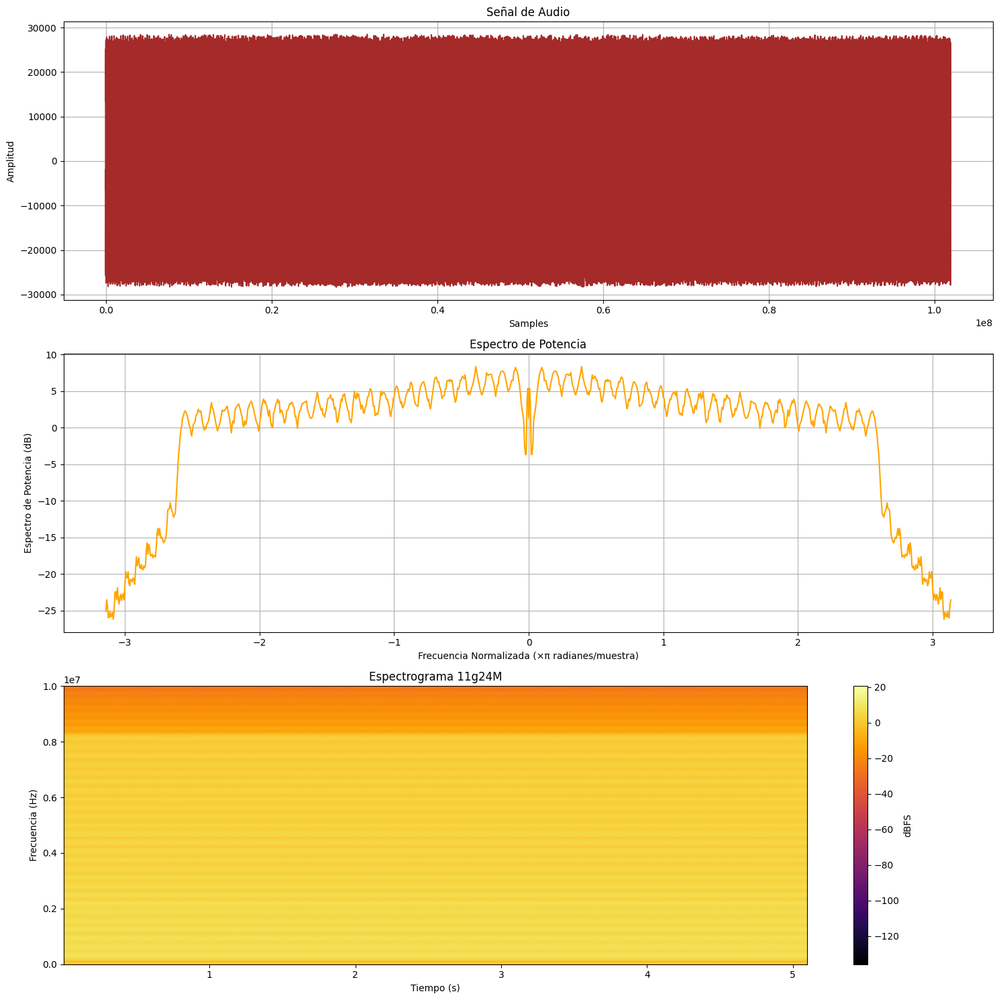

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g24M_2024-07-01T20_19_54_816.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g24M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-32-a7b2b08109ef>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


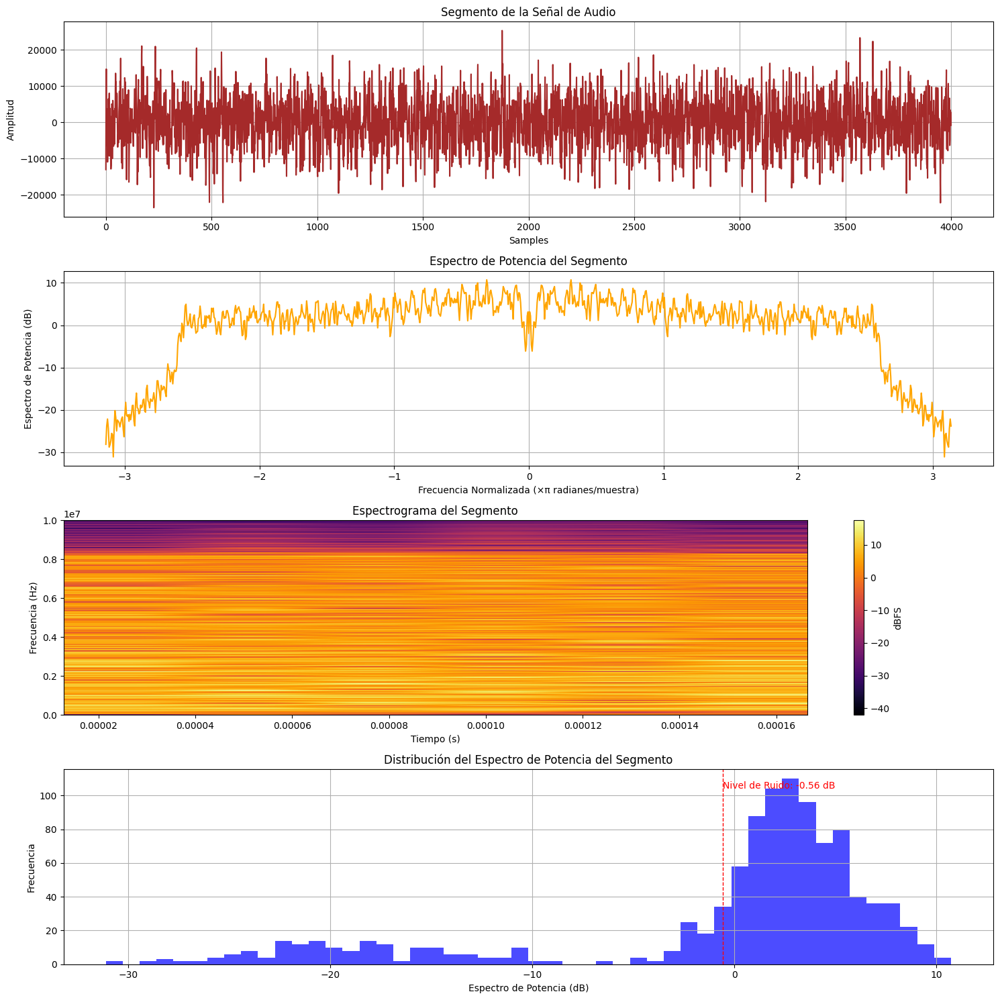

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g24M_2024-07-01T20_19_54_816.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-33-7586a80edcc4>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


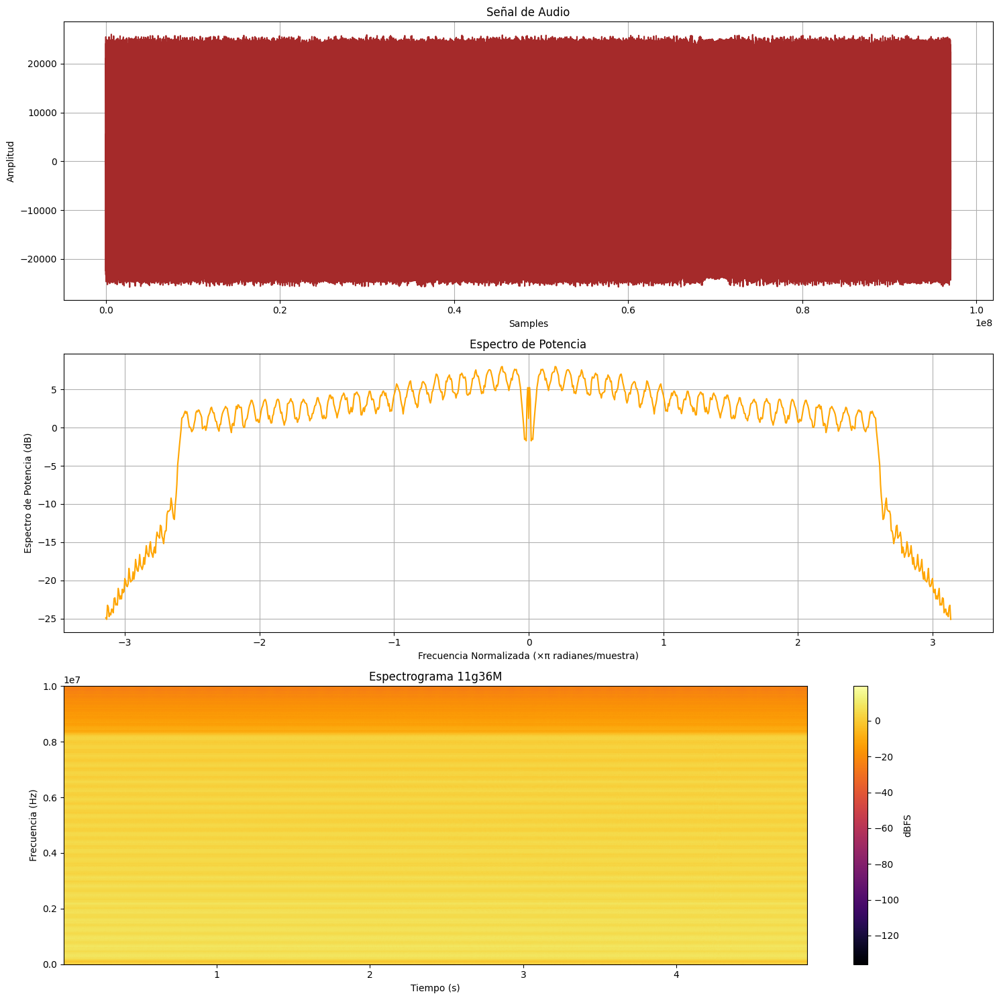

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g36M_2024-07-01T20_20_19_717.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g36M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-34-bfea5e766dea>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


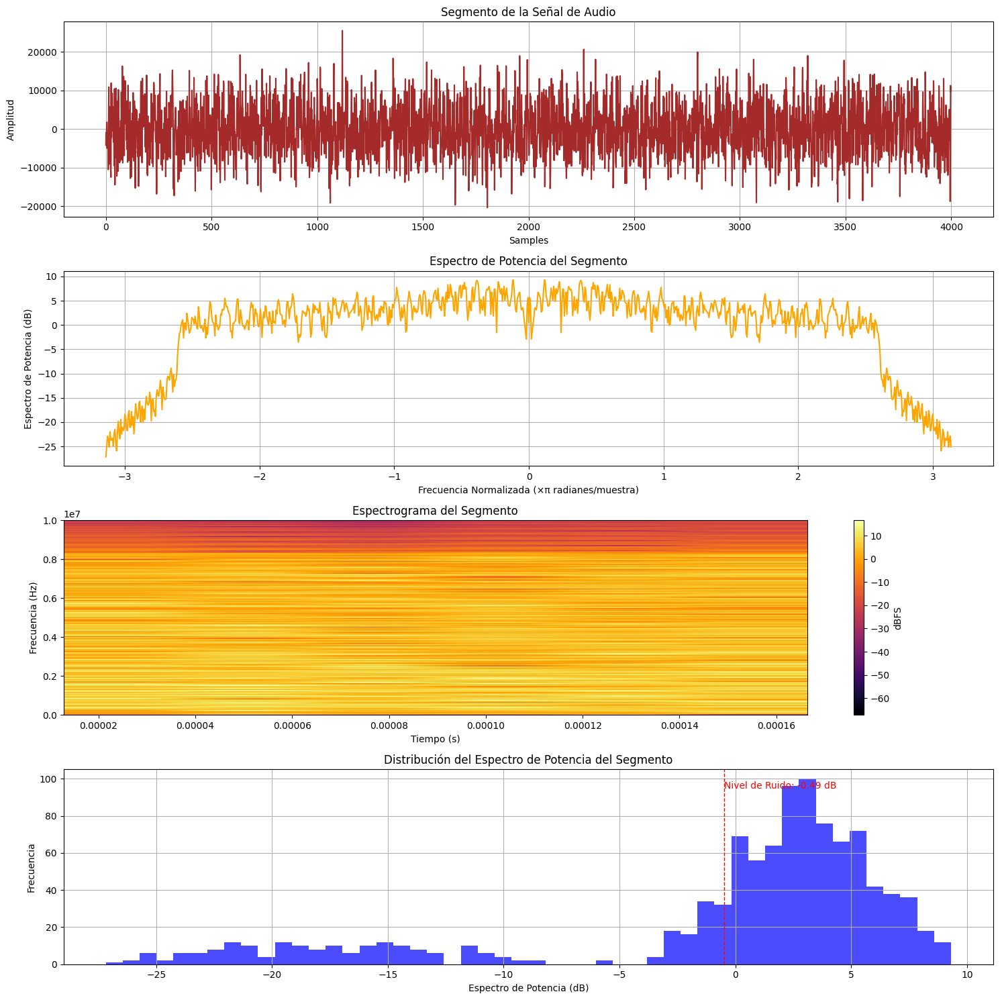

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g36M_2024-07-01T20_20_19_717.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-35-9ba9e1c4f99c>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


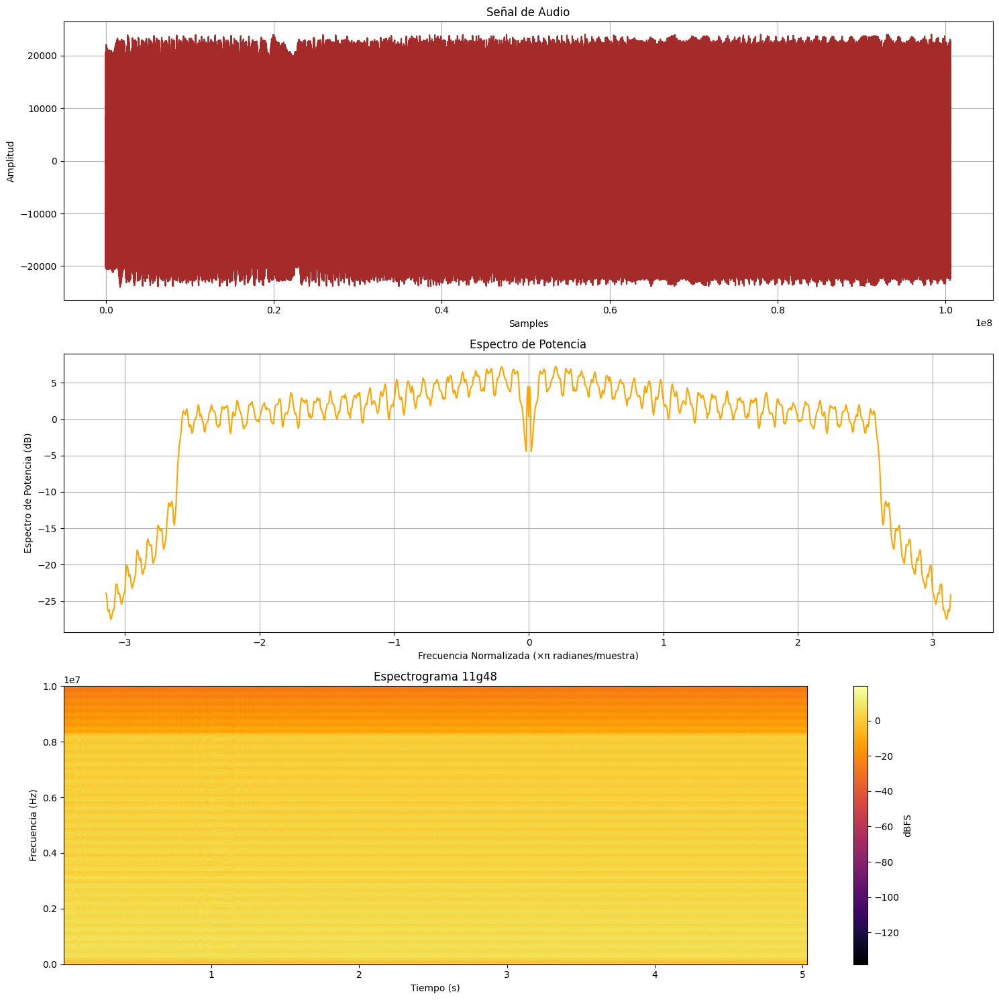

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g48M_2024-07-01T20_20_35_094.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g48')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-36-719496ac451e>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


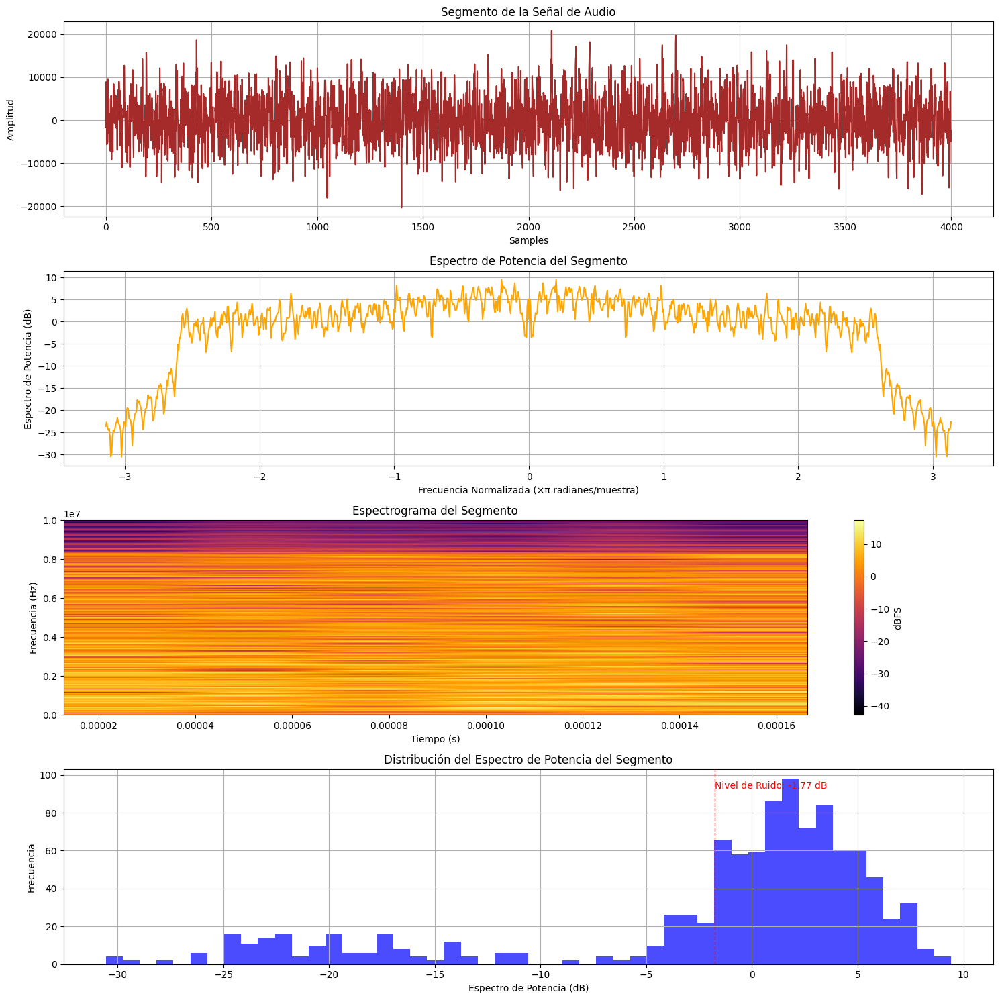

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo5SDR/11g48M_2024-07-01T20_20_35_094.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()